In [3]:
!pip install pytorch-metric-learning
!pip install faiss-gpu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.6/118.6 kB 2.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 2.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 1.3 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.4/38.4 MB 8.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 MB 1.1 MB/s eta 0:00:0000:0100:02m


In [3]:
from __future__ import print_function
import os
import cv2
from models.resnet import *
import torch
import numpy as np
import time
from config.config import Config
from torch.nn import DataParallel

ModuleNotFoundError: No module named 'models'

In [2]:
!apt-get update && apt-get install ffmpeg libsm6 libxext6  -y

Get:1 http://archive.ubuntu.com/ubuntu focal InRelease [265 kB]
Get:2 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]      
Get:3 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]        
Get:4 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Get:5 http://archive.ubuntu.com/ubuntu focal/multiverse amd64 Packages [177 kB]
Get:6 http://archive.ubuntu.com/ubuntu focal/universe amd64 Packages [11.3 MB]
Get:7 http://security.ubuntu.com/ubuntu focal-security/restricted amd64 Packages [3196 kB]
Get:8 http://archive.ubuntu.com/ubuntu focal/restricted amd64 Packages [33.4 kB]
Get:9 http://archive.ubuntu.com/ubuntu focal/main amd64 Packages [1275 kB]     
Get:10 http://archive.ubuntu.com/ubuntu focal-updates/restricted amd64 Packages [3345 kB]
Get:11 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 Packages [3806 kB]
Get:12 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 Packages [1466 kB]
Get:13 http://archive.ubuntu.

In [1]:
import numpy as np
from __future__ import print_function
import os
import cv2
import torch
import time
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import DataParallel
import torch.optim as optim
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from pytorch_metric_learning import losses, testers
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
from resnet import resnet_face18

In [9]:
model = resnet_face18(False)
model = DataParallel(model)

In [10]:
model

DataParallel(
  (module): ResNetFace(
    (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (prelu): PReLU(num_parameters=1)
    (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): IRBlock(
        (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (prelu): PReLU(num_parameters=1)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): IRBlock(
        (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=T

In [11]:
### MNIST code originally from https://github.com/pytorch/examples/blob/master/mnist/main.py ###
def train(model, loss_func, device, train_loader, optimizer, loss_optimizer, epoch):
    model.train()
    for batch_idx, (data, labels) in enumerate(train_loader):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        loss_optimizer.zero_grad()
        embeddings = model(data)
        loss = loss_func(embeddings, labels)
        loss.backward()
        optimizer.step()
        loss_optimizer.step()
        if batch_idx % 100 == 0:
            print("Epoch {} Iteration {}: Loss = {}".format(epoch, batch_idx, loss))

In [12]:
### convenient function from pytorch-metric-learning ###
def get_all_embeddings(dataset, model):
    tester = testers.BaseTester()
    return tester.get_all_embeddings(dataset, model)

In [13]:
### compute accuracy using AccuracyCalculator from pytorch-metric-learning ###
def test(train_set, test_set, model, accuracy_calculator):
    train_embeddings, train_labels = get_all_embeddings(train_set, model)
    test_embeddings, test_labels = get_all_embeddings(test_set, model)
    train_labels = train_labels.squeeze(1)
    test_labels = test_labels.squeeze(1)
    print("Computing accuracy")
    accuracies = accuracy_calculator.get_accuracy(
        test_embeddings, test_labels, train_embeddings, train_labels, False
    )
    print("Test set accuracy (Precision@1) = {}".format(accuracies["precision_at_1"]))


In [9]:
device = torch.device("cuda")

img_mean, img_std = (0.1307,), (0.3081,)

train_transform = transforms.Compose(
    [transforms.Resize((128,128)),
     transforms.ToTensor(),
     transforms.Normalize(img_mean, img_std)]
)

batch_size = 64

dataset1 = datasets.MNIST(".", train=True, download=True, transform=train_transform)
dataset2 = datasets.MNIST(".", train=False, transform=train_transform)
train_loader = torch.utils.data.DataLoader(
    dataset1, batch_size=batch_size, shuffle=True
)
test_loader = torch.utils.data.DataLoader(dataset2, batch_size=batch_size)

model = model.to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
num_epochs = 3

In [10]:

### pytorch-metric-learning stuff ###l
loss_func = losses.ArcFaceLoss(num_classes=10, embedding_size=512).to(device)
loss_optimizer = torch.optim.Adam(loss_func.parameters(), lr=1e-4)
accuracy_calculator = AccuracyCalculator(include=("precision_at_1",), k=1)

In [15]:
for epoch in range(1, num_epochs + 1):
    train(model, loss_func, device, train_loader, optimizer, loss_optimizer, epoch)
    test(dataset1, dataset2, model, accuracy_calculator)

Epoch 1 Iteration 0: Loss = 34.92182159423828
Epoch 1 Iteration 100: Loss = 4.662065505981445
Epoch 1 Iteration 200: Loss = 2.4294190406799316
Epoch 1 Iteration 300: Loss = 0.7134622931480408
Epoch 1 Iteration 400: Loss = 1.8471994400024414
Epoch 1 Iteration 500: Loss = 1.1145222187042236
Epoch 1 Iteration 600: Loss = 0.3061574101448059
Epoch 1 Iteration 700: Loss = 1.3507118225097656
Epoch 1 Iteration 800: Loss = 0.693236231803894
Epoch 1 Iteration 900: Loss = 1.255136251449585


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 313/313 [00:04<00:00, 78.18it/s]


Computing accuracy


/opt/conda/lib/python3.10/site-packages/faiss/contrib/torch_utils.py:51: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  x.storage().data_ptr() + x.storage_offset() * 4)


Test set accuracy (Precision@1) = 0.9912000000000001
Epoch 2 Iteration 0: Loss = 0.6948594450950623
Epoch 2 Iteration 100: Loss = 1.1323899030685425
Epoch 2 Iteration 200: Loss = 2.5017685890197754
Epoch 2 Iteration 300: Loss = 3.0562713146209717
Epoch 2 Iteration 400: Loss = 1.0872235298156738
Epoch 2 Iteration 500: Loss = 0.34553495049476624
Epoch 2 Iteration 600: Loss = 0.05817543715238571
Epoch 2 Iteration 700: Loss = 0.29650309681892395
Epoch 2 Iteration 800: Loss = 3.137403964996338
Epoch 2 Iteration 900: Loss = 0.6192243099212646


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 313/313 [00:03<00:00, 86.02it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9938
Epoch 3 Iteration 0: Loss = 0.4983069896697998
Epoch 3 Iteration 100: Loss = 0.6289452314376831
Epoch 3 Iteration 200: Loss = 1.6655583381652832
Epoch 3 Iteration 300: Loss = 1.2301509380340576
Epoch 3 Iteration 400: Loss = 0.1990407556295395
Epoch 3 Iteration 500: Loss = 1.3950685262680054
Epoch 3 Iteration 600: Loss = 0.7812764644622803
Epoch 3 Iteration 700: Loss = 0.7328092455863953
Epoch 3 Iteration 800: Loss = 0.6941235661506653
Epoch 3 Iteration 900: Loss = 0.3819945752620697


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 313/313 [00:03<00:00, 86.76it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9928


In [16]:
torch.save({
            'model_state_dict': model.state_dict(),
            'arcface_state_dict':loss_func.state_dict()
            }, 'resnet18_se_mnist_arcface.pth')

In [2]:
def get_bn_layers(model):
    bn_mean = []
    bn_variance = []
    cnt= 0
    for name,layer in model.named_modules():
        if isinstance(layer,nn.BatchNorm2d):
            bn_mean.append(layer.running_mean.clone().detach())
            bn_variance.append(layer.running_var.clone().detach())
    return bn_mean,bn_variance

In [3]:
def compute_stats(mean,var):
    loss = 0
    for i,j in zip(bn_mean,mean):
        loss += torch.sum(torch.norm(torch.pow(i-j,2),p=2))
    for i,j in zip(bn_var,var):
        loss += torch.sum(torch.norm(torch.pow(i-j,2),p=2))
    return loss

In [19]:
del model

In [20]:
model = resnet_face18(False)
model = DataParallel(model)
checkpoint = torch.load('resnet18_se_mnist_arcface.pth')
model.load_state_dict(checkpoint['model_state_dict'])
loss_func.load_state_dict(checkpoint['arcface_state_dict'])

<All keys matched successfully>

In [21]:
bn_mean,bn_var = get_bn_layers(model)

In [22]:
for p in loss_func.parameters():
    p.requires_grad = False
for p in model.parameters():
    p.requires_grad = False

In [23]:
alpha = 0.000001
weight_decay = 0.0001
batch_size = 8
iterations = 20000

## Target label 0

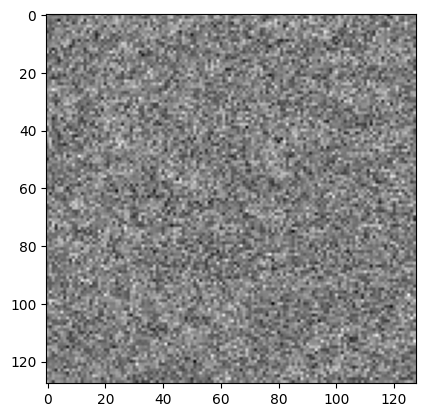

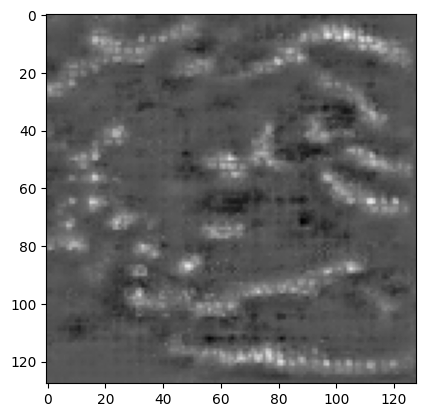

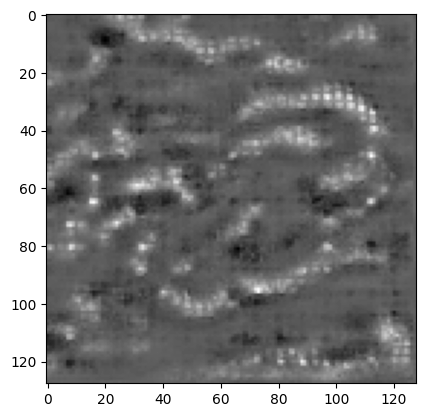

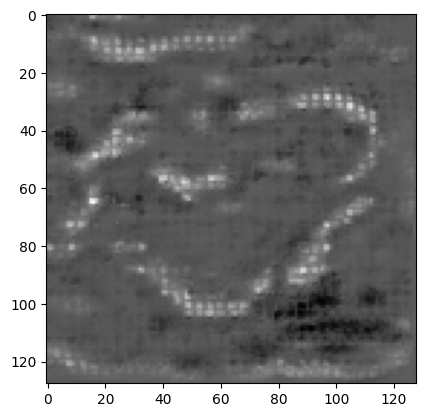

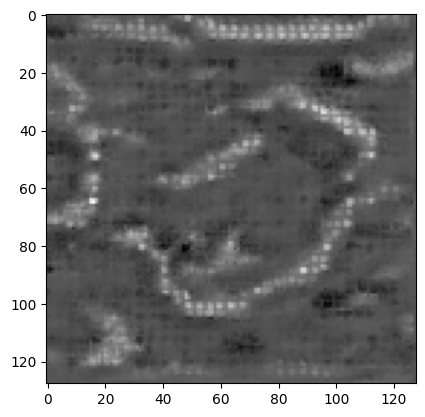

...

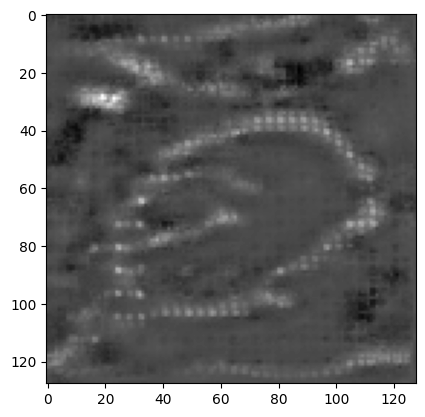

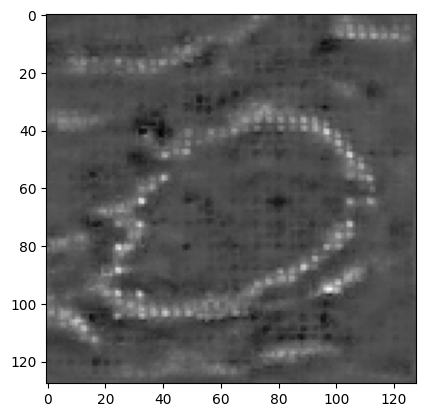

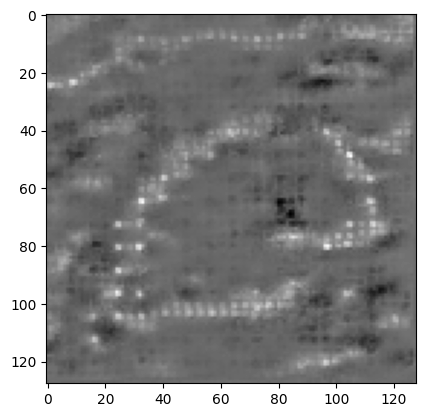

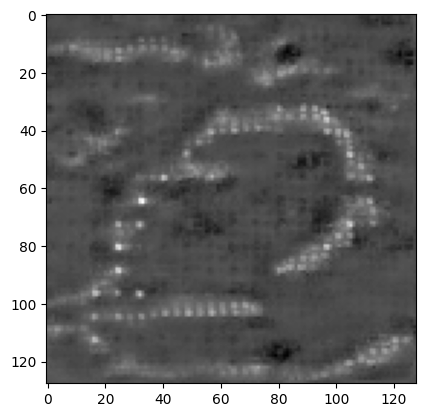

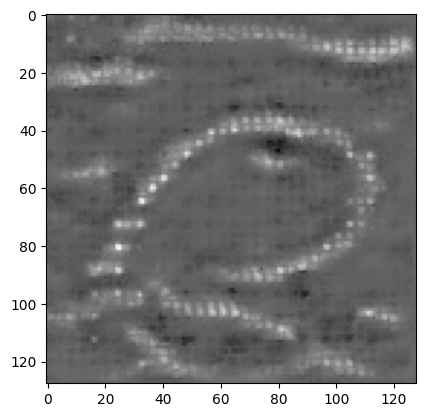

In [24]:
target = 0 
images = torch.randn(batch_size,1,128,128,requires_grad=True,device='cuda')
optimizer = torch.optim.Adam([images],lr=0.25,weight_decay=weight_decay)
for iteration in range(iterations):
    labels = torch.tensor([target]*batch_size)
    labels = labels.cuda(non_blocking=True)
    feature = model(images)
    loss = loss_func(feature, labels)
    new_bn_mean,new_bn_var =  get_bn_layers(model)
    statistic_loss = compute_stats(new_bn_mean,new_bn_var)
    total_loss = loss + alpha*statistic_loss
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    if iteration % 500 == 0:
        plt.imshow(np.transpose(images.detach().cpu().numpy(),[0,2,3,1])[0],cmap='gray')
        plt.show()

## Target label 1

In [ ]:
del model,checkpoint

In [ ]:
model = resnet_face18(False)
model = DataParallel(model)
checkpoint = torch.load('resnet18_se_mnist_arcface.pth')
model.load_state_dict(checkpoint['model_state_dict'])
loss_func.load_state_dict(checkpoint['arcface_state_dict'])

In [ ]:
bn_mean,bn_var = get_bn_layers(model)

In [ ]:
for p in loss_func.parameters():
    p.requires_grad = False
for p in model.parameters():
    p.requires_grad = False

tensor(1814587.5000, device='cuda:0') tensor(65.7033, device='cuda:0', grad_fn=<MeanBackward0>)


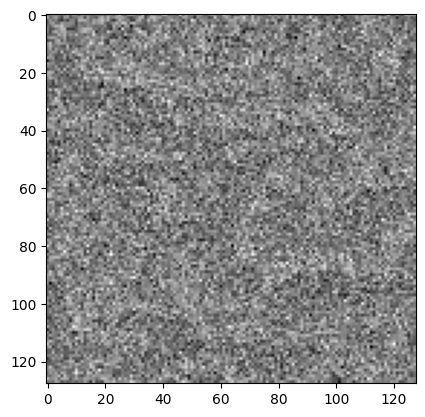

tensor(71118224., device='cuda:0') tensor(26.7072, device='cuda:0', grad_fn=<MeanBackward0>)


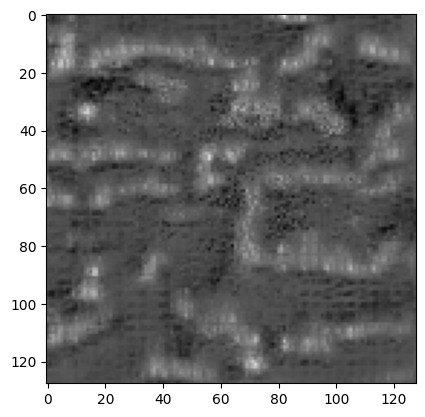

tensor(64669252., device='cuda:0') tensor(22.1304, device='cuda:0', grad_fn=<MeanBackward0>)


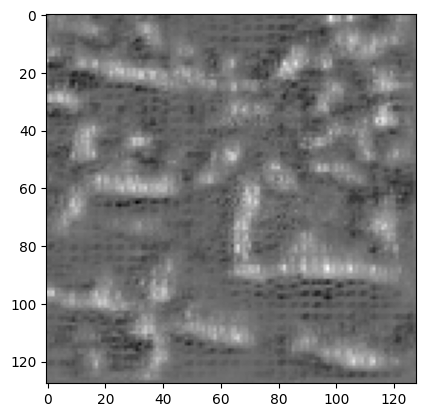

tensor(59380256., device='cuda:0') tensor(27.1695, device='cuda:0', grad_fn=<MeanBackward0>)


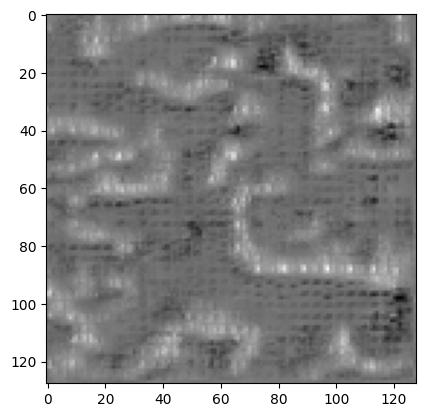

tensor(60998732., device='cuda:0') tensor(20.5284, device='cuda:0', grad_fn=<MeanBackward0>)


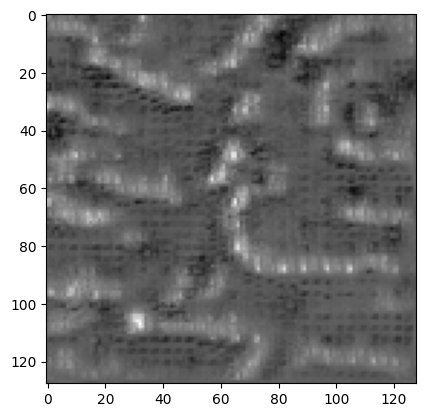

tensor(57793548., device='cuda:0') tensor(21.3138, device='cuda:0', grad_fn=<MeanBackward0>)


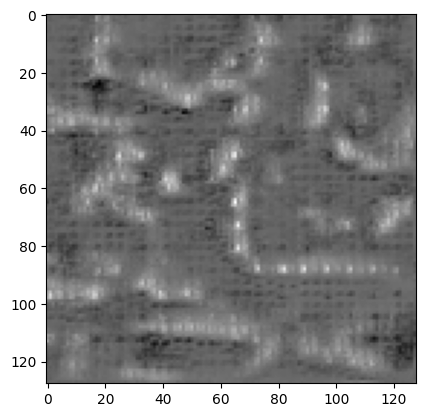

tensor(60276836., device='cuda:0') tensor(20.6894, device='cuda:0', grad_fn=<MeanBackward0>)


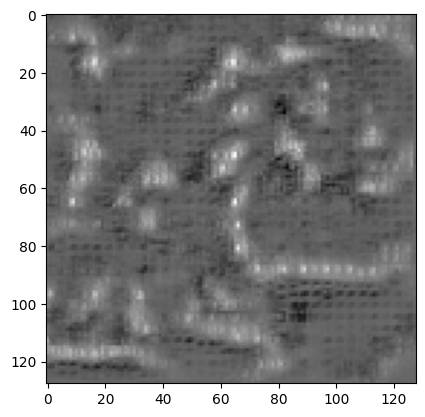

tensor(59974488., device='cuda:0') tensor(24.6371, device='cuda:0', grad_fn=<MeanBackward0>)


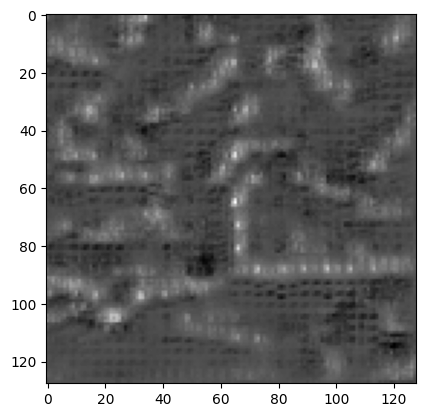

tensor(55844412., device='cuda:0') tensor(19.7922, device='cuda:0', grad_fn=<MeanBackward0>)


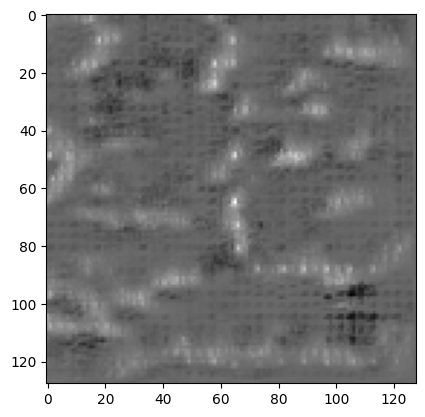

tensor(55908476., device='cuda:0') tensor(23.2693, device='cuda:0', grad_fn=<MeanBackward0>)


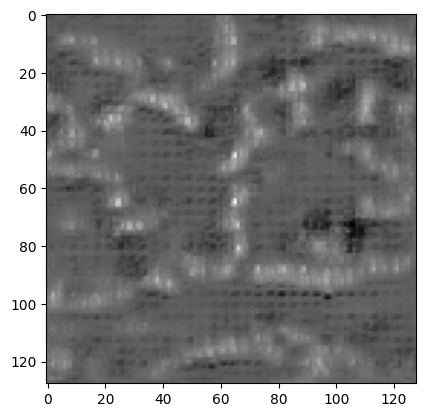

tensor(57068524., device='cuda:0') tensor(21.6069, device='cuda:0', grad_fn=<MeanBackward0>)


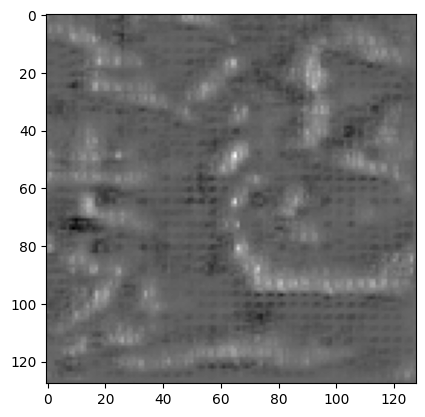

tensor(54122372., device='cuda:0') tensor(23.7474, device='cuda:0', grad_fn=<MeanBackward0>)


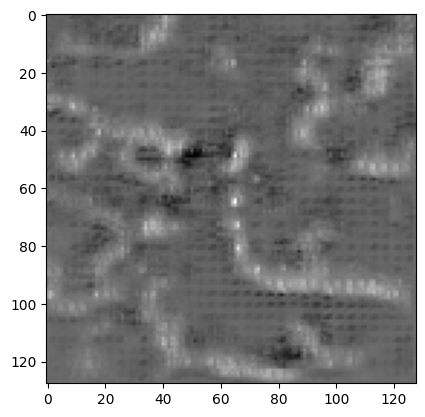

tensor(55351324., device='cuda:0') tensor(22.5167, device='cuda:0', grad_fn=<MeanBackward0>)


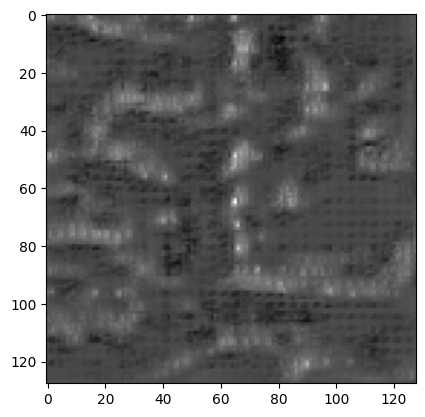

tensor(54842168., device='cuda:0') tensor(25.1615, device='cuda:0', grad_fn=<MeanBackward0>)


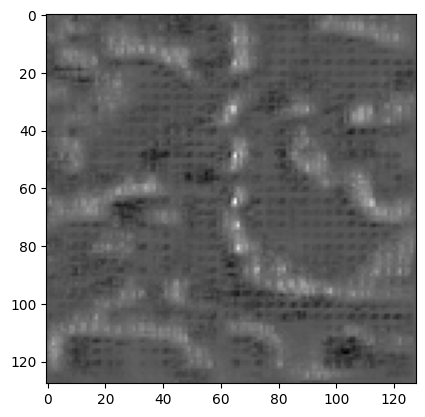

tensor(56121560., device='cuda:0') tensor(21.2738, device='cuda:0', grad_fn=<MeanBackward0>)


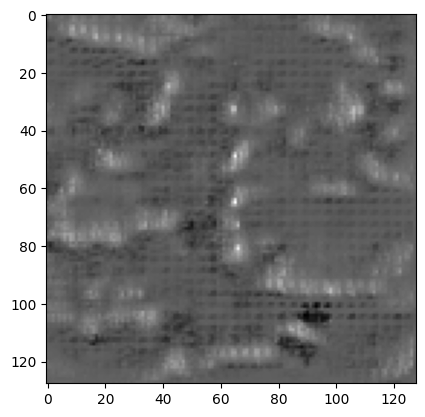

tensor(57231524., device='cuda:0') tensor(21.9903, device='cuda:0', grad_fn=<MeanBackward0>)


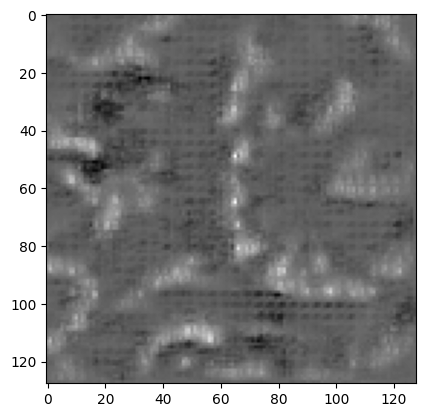

tensor(59932556., device='cuda:0') tensor(20.7878, device='cuda:0', grad_fn=<MeanBackward0>)


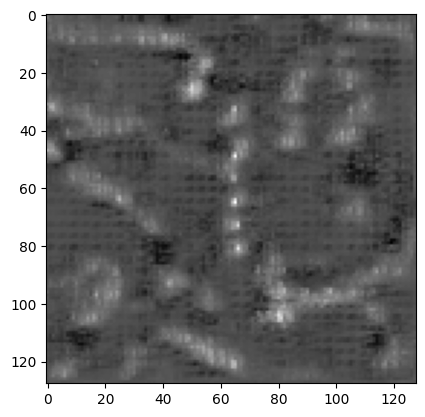

tensor(57578700., device='cuda:0') tensor(22.4380, device='cuda:0', grad_fn=<MeanBackward0>)


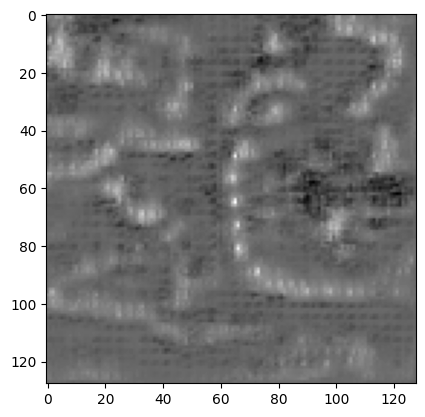

tensor(52511704., device='cuda:0') tensor(20.2928, device='cuda:0', grad_fn=<MeanBackward0>)


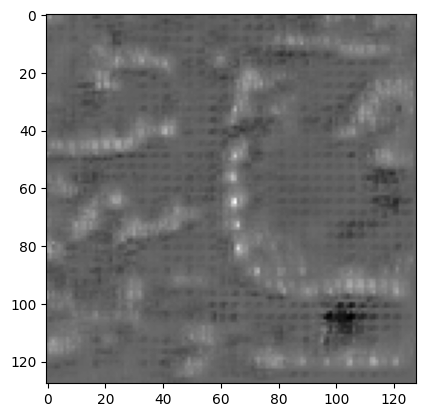

tensor(49014148., device='cuda:0') tensor(23.0850, device='cuda:0', grad_fn=<MeanBackward0>)


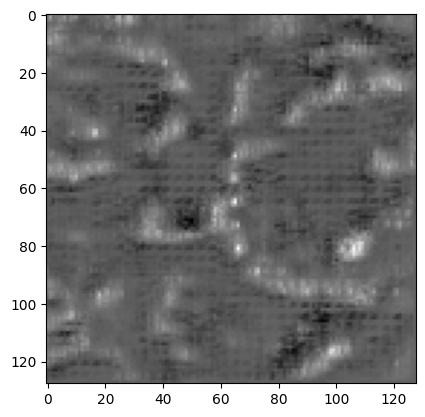

tensor(53714580., device='cuda:0') tensor(21.0339, device='cuda:0', grad_fn=<MeanBackward0>)


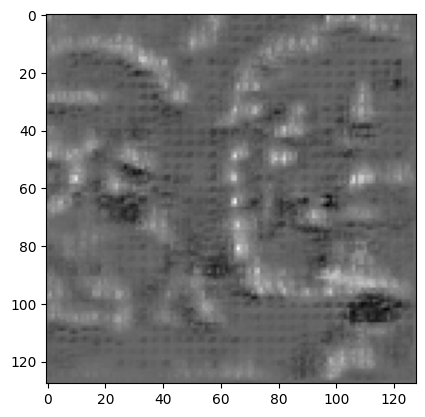

tensor(52616896., device='cuda:0') tensor(24.5085, device='cuda:0', grad_fn=<MeanBackward0>)


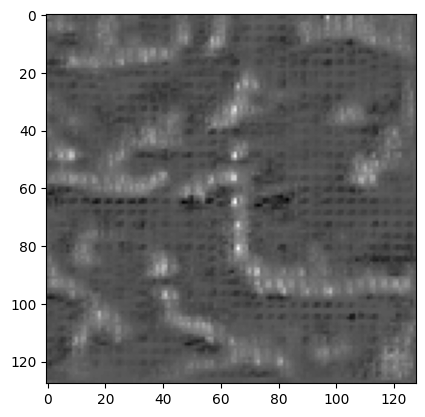

tensor(51315596., device='cuda:0') tensor(22.2833, device='cuda:0', grad_fn=<MeanBackward0>)


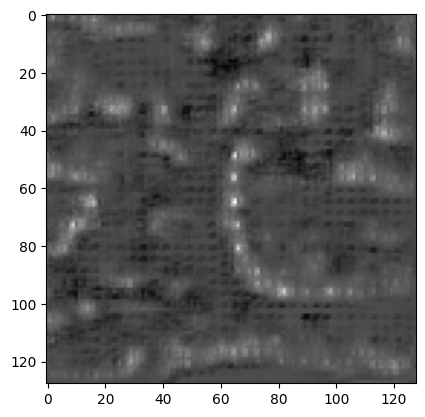

tensor(51775996., device='cuda:0') tensor(20.4477, device='cuda:0', grad_fn=<MeanBackward0>)


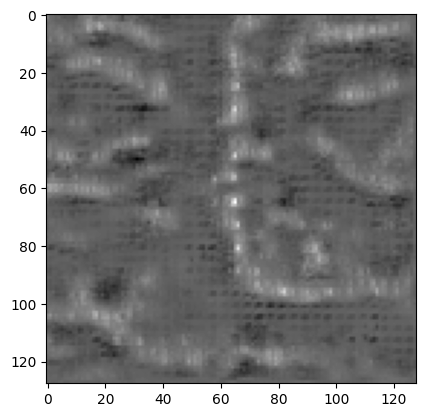

tensor(53020372., device='cuda:0') tensor(20.6940, device='cuda:0', grad_fn=<MeanBackward0>)


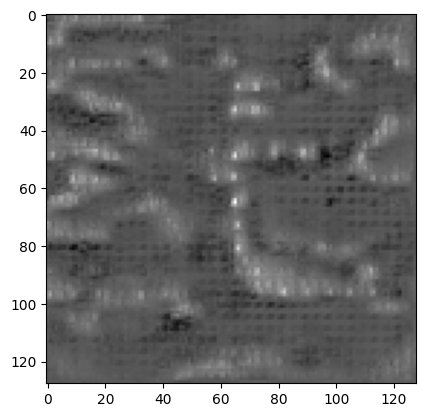

tensor(53769172., device='cuda:0') tensor(20.8376, device='cuda:0', grad_fn=<MeanBackward0>)


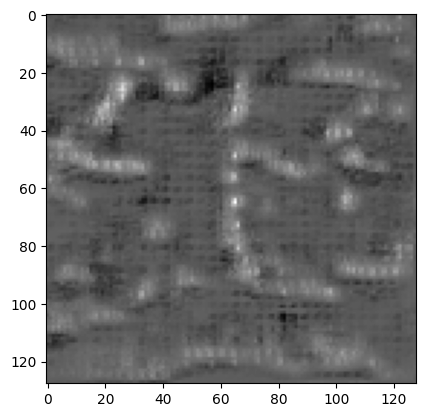

tensor(51329260., device='cuda:0') tensor(25.0746, device='cuda:0', grad_fn=<MeanBackward0>)


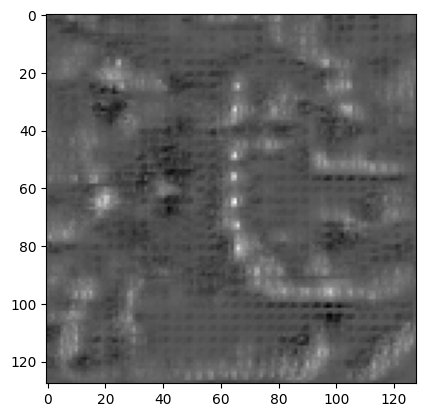

tensor(54235164., device='cuda:0') tensor(20.8165, device='cuda:0', grad_fn=<MeanBackward0>)


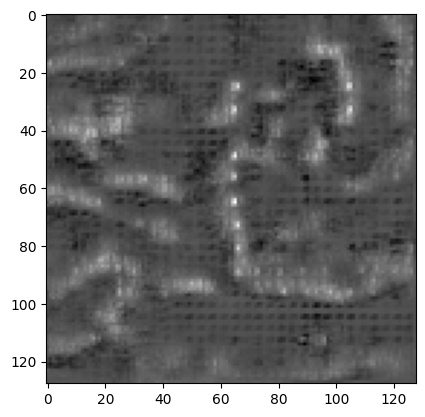

tensor(55495404., device='cuda:0') tensor(22.6644, device='cuda:0', grad_fn=<MeanBackward0>)


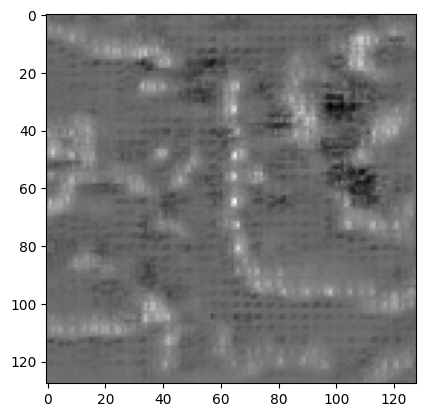

tensor(53944224., device='cuda:0') tensor(24.8816, device='cuda:0', grad_fn=<MeanBackward0>)


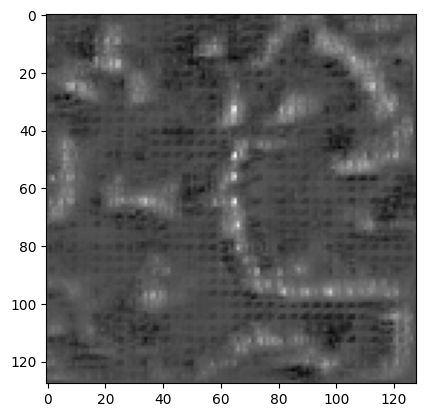

tensor(53848948., device='cuda:0') tensor(21.6735, device='cuda:0', grad_fn=<MeanBackward0>)


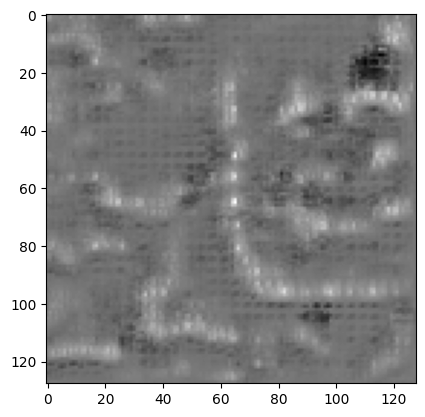

tensor(52981888., device='cuda:0') tensor(23.0644, device='cuda:0', grad_fn=<MeanBackward0>)


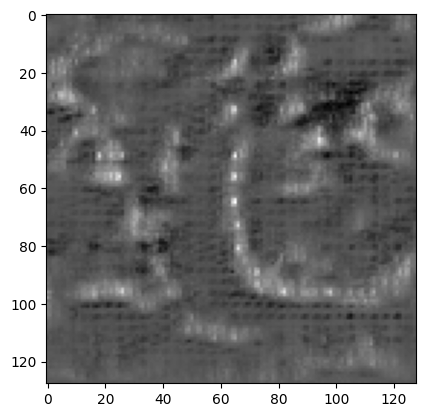

tensor(55436580., device='cuda:0') tensor(22.9736, device='cuda:0', grad_fn=<MeanBackward0>)


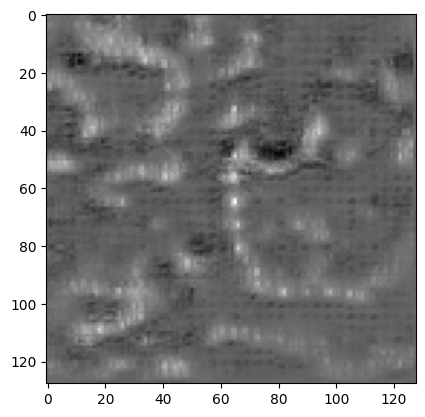

tensor(53013124., device='cuda:0') tensor(22.4268, device='cuda:0', grad_fn=<MeanBackward0>)


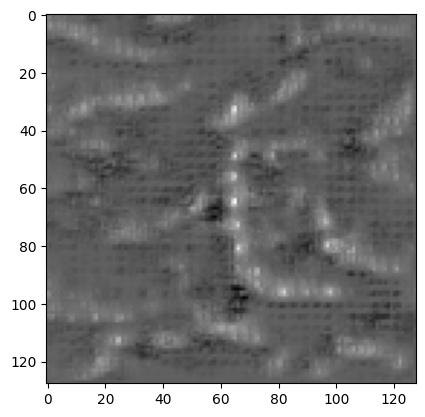

tensor(57480772., device='cuda:0') tensor(21.8288, device='cuda:0', grad_fn=<MeanBackward0>)


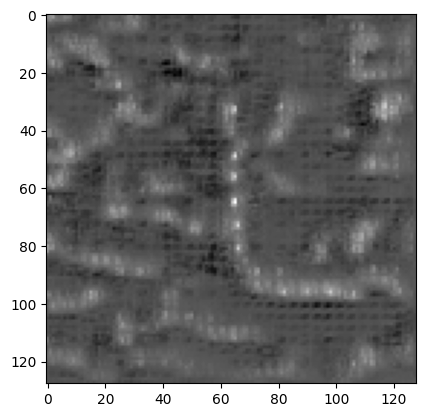

tensor(51860664., device='cuda:0') tensor(21.6854, device='cuda:0', grad_fn=<MeanBackward0>)


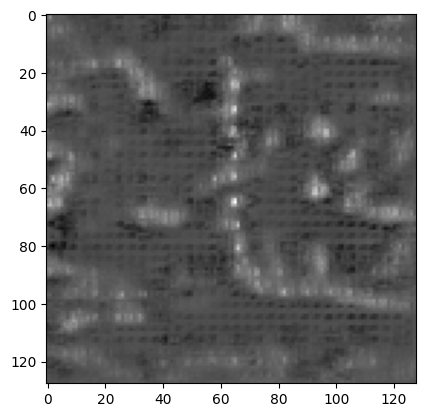

tensor(55717840., device='cuda:0') tensor(23.9857, device='cuda:0', grad_fn=<MeanBackward0>)


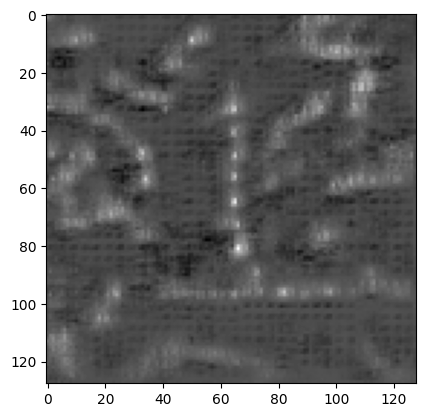

tensor(57172552., device='cuda:0') tensor(20.5946, device='cuda:0', grad_fn=<MeanBackward0>)


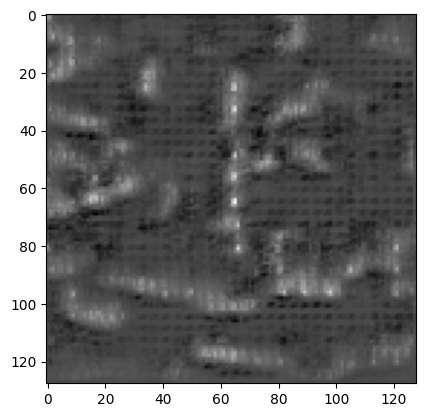

tensor(52242228., device='cuda:0') tensor(21.9802, device='cuda:0', grad_fn=<MeanBackward0>)


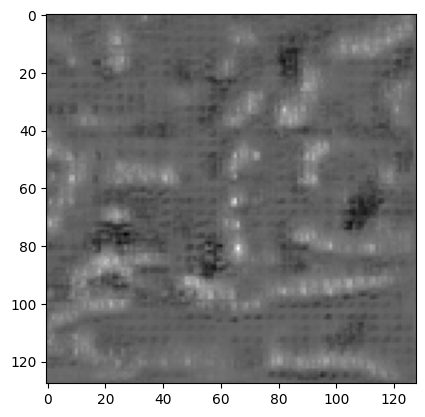

tensor(53318784., device='cuda:0') tensor(21.1736, device='cuda:0', grad_fn=<MeanBackward0>)


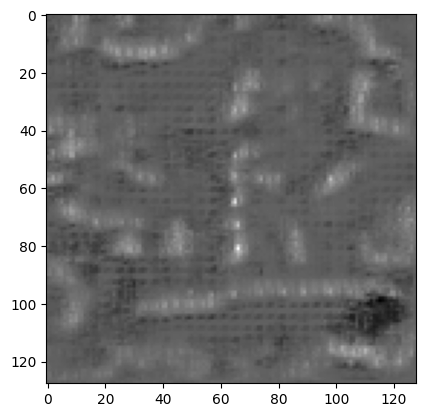

In [133]:
target = 1
images = torch.randn(batch_size,1,128,128,requires_grad=True,device='cuda')
optimizer = torch.optim.Adam([images],lr=0.25,weight_decay=weight_decay)
for iteration in range(iterations):
    labels = torch.tensor([target]*batch_size)
    labels = labels.cuda(non_blocking=True)
    feature = model(images)
    loss = loss_func(feature, labels)
    new_bn_mean,new_bn_var =  get_bn_layers(model)
    statistic_loss = compute_stats(new_bn_mean,new_bn_var)
    total_loss = loss + alpha*statistic_loss
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    if iteration % 500 == 0:
        plt.imshow(np.transpose(images.detach().cpu().numpy(),[0,2,3,1])[0],cmap='gray')
        plt.show()